In [1]:
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score
from sklearn.utils.class_weight import compute_sample_weight

from xgboost import XGBClassifier

print("Environment ready for modeling ✅")


Environment ready for modeling ✅


In [2]:
data_path = "../data/processed/accidents_cleaned.csv"

df = pd.read_csv(data_path)

print("Clean dataset loaded ✅")
print("Shape:", df.shape)

df.head()


Clean dataset loaded ✅
Shape: (2047081, 13)


,Latitude,Longitude,Weather_Conditions,Road_Surface_Conditions,Light_Conditions,Speed_limit,Urban_or_Rural_Area,year,month,day,day_of_week,hour,accident_risk_level
0,51.489096,-0.191170,Raining no high winds,Wet or damp,Daylight,30.0,Urban,2005,1,4,1,17.0,1
1,51.520075,-0.211708,Fine no high winds,Dry,Darkness - lights lit,30.0,Urban,2005,1,5,2,17.0,0
2,51.525301,-0.206458,Fine no high winds,Dry,Darkness - lights lit,30.0,Urban,2005,1,6,3,0.0,0
3,51.482442,-0.173862,Fine no high winds,Dry,Daylight,30.0,Urban,2005,1,7,4,10.0,0
4,51.495752,-0.156618,Fine no high winds,Wet or damp,Darkness - lighting unknown,30.0,Urban,2005,1,10,0,21.0,0


In [3]:
# Target
y = df['accident_risk_level']

# Features (everything except target)
X = df.drop(columns=['accident_risk_level'])

print("Feature shape:", X.shape)
print("Target shape:", y.shape)

y.value_counts()


Feature shape: (2047081, 12)
Target shape: (2047081,)


accident_risk_level
0    1734402
1     286310
2      26369
Name: count, dtype: int64

In [4]:
# Convert categorical features into numeric
X = pd.get_dummies(X, drop_first=True)

print("Encoded feature shape:", X.shape)
X.head()


Encoded feature shape: (2047081, 29)


,Latitude,Longitude,Speed_limit,year,month,day,day_of_week,hour,Weather_Conditions_Fine + high winds,Weather_Conditions_Fine no high winds,...,Road_Surface_Conditions_Frost or ice,Road_Surface_Conditions_Snow,Road_Surface_Conditions_Wet or damp,Light_Conditions_Darkness - lights lit,Light_Conditions_Darkness - lights unlit,Light_Conditions_Darkness - no lighting,Light_Conditions_Data missing or out of range,Light_Conditions_Daylight,Urban_or_Rural_Area_Unallocated,Urban_or_Rural_Area_Urban
0,51.489096,-0.191170,30.0,2005,1,4,1,17.0,False,False,...,False,False,True,False,False,False,False,True,False,True
1,51.520075,-0.211708,30.0,2005,1,5,2,17.0,False,True,...,False,False,False,True,False,False,False,False,False,True
2,51.525301,-0.206458,30.0,2005,1,6,3,0.0,False,True,...,False,False,False,True,False,False,False,False,False,True
3,51.482442,-0.173862,30.0,2005,1,7,4,10.0,False,True,...,False,False,False,False,False,False,False,True,False,True
4,51.495752,-0.156618,30.0,2005,1,10,0,21.0,False,True,...,False,False,True,False,False,False,False,False,False,True


In [5]:
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.2,
    random_state=42,
    stratify=y
)

print("Train shape:", X_train.shape)
print("Test shape:", X_test.shape)

print("\nTest set class distribution:")
print(y_test.value_counts())


Train shape: (1637664, 29)
Test shape: (409417, 29)

Test set class distribution:
accident_risk_level
0    346881
1     57262
2      5274
Name: count, dtype: int64


In [6]:
sample_weights = compute_sample_weight(
    class_weight='balanced',
    y=y_train
)

print("Sample weights computed ✅")


Sample weights computed ✅


In [7]:
model = XGBClassifier(
    objective='multi:softprob',
    num_class=3,
    eval_metric='mlogloss',
    max_depth=6,
    learning_rate=0.1,
    n_estimators=100,
    random_state=42,
    n_jobs=-1
)

model.fit(X_train, y_train, sample_weight=sample_weights)

print("Model trained with class balancing ✅")


Model trained with class balancing ✅


In [8]:
y_pred = model.predict(X_test)

print("Accuracy:", accuracy_score(y_test, y_pred))
print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))


Accuracy: 0.518764487063312

Classification Report:

              precision    recall  f1-score   support

           0       0.89      0.56      0.69    346881
           1       0.17      0.25      0.20     57262
           2       0.03      0.62      0.06      5274

    accuracy                           0.52    409417
   macro avg       0.36      0.48      0.32    409417
weighted avg       0.78      0.52      0.61    409417



In [9]:
# Create binary classification target
# 1 = Fatal
# 0 = Non-Fatal (Slight + Serious)

df_binary = df.copy()

df_binary['fatal_risk'] = df_binary['accident_risk_level'].apply(
    lambda x: 1 if x == 2 else 0
)

df_binary['fatal_risk'].value_counts()


fatal_risk
0    2020712
1      26369
Name: count, dtype: int64

In [10]:
# Target
y_bin = df_binary['fatal_risk']

# Features (drop both risk columns)
X_bin = df_binary.drop(columns=['accident_risk_level', 'fatal_risk'])

print("Feature shape:", X_bin.shape)
print("Target distribution:\n")
print(y_bin.value_counts())


Feature shape: (2047081, 12)
Target distribution:

fatal_risk
0    2020712
1      26369
Name: count, dtype: int64


In [11]:
# One-hot encode categorical features
X_bin = pd.get_dummies(X_bin, drop_first=True)

print("Encoded shape:", X_bin.shape)


Encoded shape: (2047081, 29)


In [12]:
X_train_b, X_test_b, y_train_b, y_test_b = train_test_split(
    X_bin,
    y_bin,
    test_size=0.2,
    random_state=42,
    stratify=y_bin
)

print("Train shape:", X_train_b.shape)
print("Test shape:", X_test_b.shape)

print("\nTest distribution:")
print(y_test_b.value_counts())


Train shape: (1637664, 29)
Test shape: (409417, 29)

Test distribution:
fatal_risk
0    404143
1      5274
Name: count, dtype: int64


In [13]:
# Calculate imbalance ratio
neg = y_train_b.value_counts()[0]
pos = y_train_b.value_counts()[1]

scale_weight = neg / pos

print("Scale_pos_weight:", scale_weight)


Scale_pos_weight: 76.63280398198626


In [14]:
model_bin = XGBClassifier(
    objective='binary:logistic',
    eval_metric='logloss',
    max_depth=6,
    learning_rate=0.1,
    n_estimators=150,
    scale_pos_weight=scale_weight,
    random_state=42,
    n_jobs=-1
)

model_bin.fit(X_train_b, y_train_b)

print("Binary fatal-risk model trained ✅")


Binary fatal-risk model trained ✅


In [15]:
from sklearn.metrics import classification_report, accuracy_score, roc_auc_score

# Predictions
y_pred_b = model_bin.predict(X_test_b)
y_prob_b = model_bin.predict_proba(X_test_b)[:, 1]

print("Accuracy:", accuracy_score(y_test_b, y_pred_b))
print("\nClassification Report:\n")
print(classification_report(y_test_b, y_pred_b))

print("ROC-AUC:", roc_auc_score(y_test_b, y_prob_b))


Accuracy: 0.7185143753190513

Classification Report:

              precision    recall  f1-score   support

           0       0.99      0.72      0.83    404143
           1       0.03      0.65      0.06      5274

    accuracy                           0.72    409417
   macro avg       0.51      0.69      0.45    409417
weighted avg       0.98      0.72      0.82    409417

ROC-AUC: 0.7431297444229922


In [16]:
import numpy as np

# Lower threshold to 0.3
y_pred_custom = (y_prob_b >= 0.3).astype(int)

print(classification_report(y_test_b, y_pred_custom))


              precision    recall  f1-score   support

           0       1.00      0.38      0.56    404143
           1       0.02      0.88      0.04      5274

    accuracy                           0.39    409417
   macro avg       0.51      0.63      0.30    409417
weighted avg       0.98      0.39      0.55    409417



In [18]:
import matplotlib.pyplot as plt
import pandas as pd

# Get feature importance
importance = model_bin.feature_importances_

feature_importance_df = pd.DataFrame({
    'Feature': X_train_b.columns,
    'Importance': importance
}).sort_values(by='Importance', ascending=False)

# Show top 15 features
feature_importance_df.head(15)

,Feature,Importance
2,Speed_limit,0.225858
24,Light_Conditions_Darkness - no lighting,0.198284
26,Light_Conditions_Daylight,0.107874
28,Urban_or_Rural_Area_Urban,0.082704
7,hour,0.042108
9,Weather_Conditions_Fine no high winds,0.035860
17,Road_Surface_Conditions_Dry,0.028083
21,Road_Surface_Conditions_Wet or damp,0.024527
8,Weather_Conditions_Fine + high winds,0.021158
6,day_of_week,0.019959


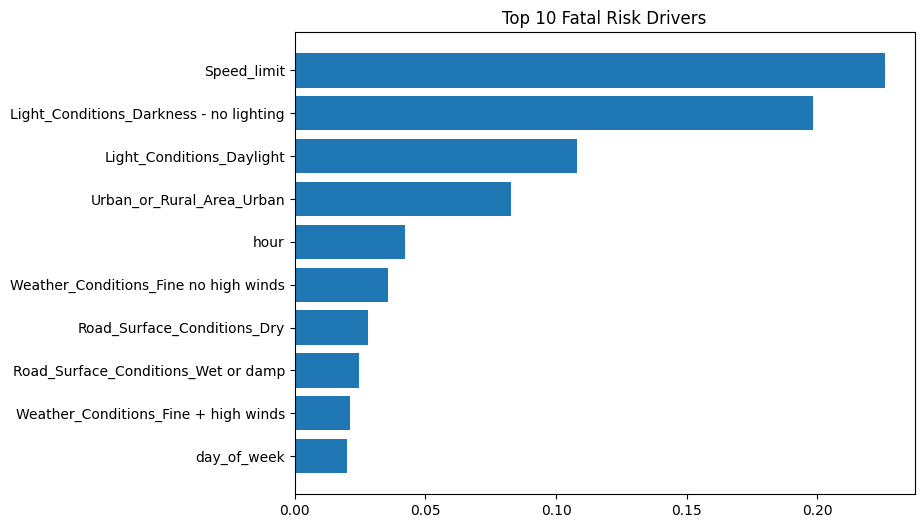

In [20]:
top_features = feature_importance_df.head(10)

plt.figure(figsize=(8,6))
plt.barh(top_features['Feature'], top_features['Importance'])
plt.gca().invert_yaxis()
plt.title("Top 10 Fatal Risk Drivers")
plt.show()


In [21]:
# Get fatal probability for test set
risk_prob = model_bin.predict_proba(X_test_b)[:, 1]

# Convert to 0–100 scale
risk_score = risk_prob * 100

print("Sample Risk Scores:")
print(risk_score[:10])


Sample Risk Scores:
[27.005377 25.08781  74.3609   25.93562  67.384224 39.944595 68.96767
 51.661854 73.68961  70.20497 ]


In [22]:
def risk_category(score):
    if score >= 70:
        return "High Risk"
    elif score >= 40:
        return "Medium Risk"
    else:
        return "Low Risk"

risk_labels = [risk_category(s) for s in risk_score]

pd.Series(risk_labels).value_counts()


Low Risk       246715
Medium Risk    125608
High Risk       37094
Name: count, dtype: int64

In [23]:
risk_output = X_test_b[['Latitude', 'Longitude']].copy()
risk_output['risk_score'] = risk_score
risk_output['risk_category'] = risk_labels

risk_output.head()


,Latitude,Longitude,risk_score,risk_category
1386807,53.445324,-2.231379,27.005377,Low Risk
531741,50.827591,-0.141602,25.087811,Low Risk
68462,53.716593,-1.893442,74.360901,High Risk
554663,51.492515,-3.215982,25.935619,Low Risk
341634,51.283183,0.243847,67.384224,Medium Risk


In [24]:
# Create spatial risk output
risk_output = X_test_b[['Latitude', 'Longitude']].copy()

risk_output['risk_score'] = risk_score
risk_output['risk_category'] = risk_labels

risk_output.head()


,Latitude,Longitude,risk_score,risk_category
1386807,53.445324,-2.231379,27.005377,Low Risk
531741,50.827591,-0.141602,25.087811,Low Risk
68462,53.716593,-1.893442,74.360901,High Risk
554663,51.492515,-3.215982,25.935619,Low Risk
341634,51.283183,0.243847,67.384224,Medium Risk


In [25]:
# Create grid cells (approximate 0.01 degree grid)
risk_output['lat_grid'] = (risk_output['Latitude'] // 0.01) * 0.01
risk_output['lon_grid'] = (risk_output['Longitude'] // 0.01) * 0.01

# Aggregate risk by grid
grid_risk = risk_output.groupby(['lat_grid', 'lon_grid'])['risk_score'].mean().reset_index()

grid_risk.sort_values(by='risk_score', ascending=False).head(10)


,lat_grid,lon_grid,risk_score
72241,58.90,-2.93,93.357162
71230,57.44,-4.15,93.305855
71821,57.65,-2.21,93.159027
72023,57.90,-4.03,92.936798
69622,56.50,-3.20,92.825211
70688,57.18,-2.22,92.629211
71443,57.51,-2.00,92.550888
71929,57.70,-4.27,92.457451
72181,58.48,-3.46,92.293518
71317,57.47,-3.20,92.230492


In [26]:
!pip install folium



   -------------------------- ------------- 2/3 [folium]
   ---------------------------------------- 3/3 [folium]



In [27]:
import folium
from folium.plugins import HeatMap

# Center map on average coordinates
map_center = [
    risk_output['Latitude'].mean(),
    risk_output['Longitude'].mean()
]

risk_map = folium.Map(location=map_center, zoom_start=6)

# Prepare heatmap data
heat_data = [
    [row['Latitude'], row['Longitude'], row['risk_score']]
    for index, row in risk_output.iterrows()
]

HeatMap(heat_data, radius=8).add_to(risk_map)

risk_map


In [29]:
import os

os.makedirs("../docs", exist_ok=True)

print("Docs folder created ✅")


Docs folder created ✅


In [30]:
risk_map.save("../docs/fatal_risk_heatmap.html")

print("Heatmap exported successfully ✅")


Heatmap exported successfully ✅
